<a href="https://colab.research.google.com/github/torbenbillow/CBS-AML-PROJECT/blob/main/notebooks/01_price_target.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The intention of the following model is to provide Airbnb hosts with a real-time, automated pricing tool that provides a suggestion based on a property's entered attributes (location, number of beds/baths, etc.).

The source data is a point-in-time scrape of Airbnb listings in Copenhagen. Our core assumption is that the property's listed price, after filtering for active listings (see subsequent sections), generally reflects a reasonable market value given the property's characteristics. We recognize that this is not always the case, and the model will thereby learn from listings with potentially inflated prices (relative to their peers) or low occupancy.

In an ideal scenario, a more robust training target would be based on historical, "successful" listings; that is, those with a high, sustained occupancy rate. Access to historical booking and occupancy data would provide a more trustworthy baseline for predicting optimal (profitable) prices, rather than just current listed prices.

# IMPORT LIBRARIES FOR DATA IMPORT AND CLEANSING

In [253]:
import pandas as pd
import numpy as np

from google.colab import drive
pd.options.mode.copy_on_write = True   # Make sure that when copies are made, the original object isn't subsequently updated

# LOAD DATA FROM GOOGLE DRIVE

In [254]:
print("Loading raw data from Google Drive location...\n")
file_id = "1Iyr7zX8u0gKWKUWCSgZUpcvbTuYBmw1V"             # File id from Google Drive
url = f"https://drive.google.com/uc?id={file_id}"         # URL to Google Sheet with the inputted file_id
listings_raw = pd.read_csv(url)                           # Store the data in the "listings_raw" variable

print("Raw data successfully loaded.\n")
print("Raw dataframe shape:",listings_raw.shape)          # Print the shape of the dataframe so we have a baseline

Loading raw data from Google Drive location...

Raw data successfully loaded.

Raw dataframe shape: (22684, 79)


# DATA CLEANSING

## DISPLAY ALL RAW DATA COLUMNS AND MANUALLY REMOVE UNWANTED COLUMNS

In the code blocks below, we inspect the various columns present in the original data set and elect to drop a number of them. We have, for example, made the determination that a number of columns are irrelevant for price prediction (domain knowledge), others are completely empty and thus provide no value, and a handfull display elements of multicollinearity and are thereby removed. All reasons are noted as comments in the code.

In [255]:
# Copy the original dataframe to the df variable, so the original data set can be used for comparisons
df = listings_raw.copy()

# List all columns
pd.set_option('display.max_rows', None)
display(pd.DataFrame({"column_name": df.columns}))

,column_name
0,id
1,listing_url
2,scrape_id
3,last_scraped
4,source
5,name
6,description
7,neighborhood_overview
8,picture_url
9,host_id


In [256]:
# The following columns are irrelevant, and thus, we have chosen to drop them.
df = df.drop(columns=["listing_url","scrape_id","source","host_id","host_url",
                      "calendar_last_scraped","first_review","host_neighbourhood"])

# The following columns could impact a listing's "success" (discrimination based on a name or
# picture, for example), but due to the complexity of including them, and the scope of this
# project, we have chosen to drop them.
df = df.drop(columns=["name","picture_url","host_name","host_thumbnail_url","host_picture_url"])

# Dropping the following columns in favor of "calculated_host_listings_count," because that is
# the direct calculation of how many listings a host has at the time of scrape. The metadata
# also notes that the following calculations are "unknown," and thereby less trustworthy.
df = df.drop(columns=["host_listings_count","host_total_listings_count"])

# Dropping in favor of "host_identitity_verified," which is a boolean that indicates whether
# or not the host is verified.
df = df.drop(columns=["host_verifications"])

# Dropping in favor of "neighborhood_cleansed."
df = df.drop(columns=["neighbourhood"])

# Dropping the following, as they are completely empty attributes.
df = df.drop(columns=["neighbourhood_group_cleansed","calendar_updated","license"])

# Dropping the following columns in favor of "mini_nights" and "maximum_nights."
df = df.drop(columns=["minimum_minimum_nights","maximum_minimum_nights","minimum_maximum_nights",
                      "maximum_maximum_nights","minimum_nights_avg_ntm","maximum_nights_avg_ntm"])

# Dropping the following columns, because there is no information about they represent.
df = df.drop(columns=["has_availability","availability_eoy"])

# Dropping the following columns in favor "number_of_reviews" for simplicity.
df = df.drop(columns=["number_of_reviews_ltm","number_of_reviews_l30d"])

# Dropping in favor "number_of_reviews" for simplicity.
df = df.drop(columns=["number_of_reviews_ly"])

# Irrelevant and would introduce data leakage.
df = df.drop(columns=["estimated_revenue_l365d"])

# Dropping the following attributes because they will not be available at the time of prediction.
df = df.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness",
                      "review_scores_checkin","review_scores_communication","review_scores_location",
                      "review_scores_value","availability_30","availability_60","availability_90",
                      "availability_365","estimated_occupancy_l365d","last_review"])

# Dropping the following columns in favor of "calculated_host_listings_count" for simplicity.
df = df.drop(columns=["calculated_host_listings_count_entire_homes","calculated_host_listings_count_private_rooms",
                      "calculated_host_listings_count_shared_rooms"])

# Dropping in favor of "number_of_reviews."
df = df.drop(columns=["reviews_per_month"])

In [257]:
# Print size of dataframe before drops
print("Dataframe shape before column drops:",listings_raw.shape)
print("\n")
# Print size of dataframe after drops
print("Dataframe shape after column drops:",df.shape)
print("\n")
# Print number of columns and rows dropped
print("Number of columns removed:",listings_raw.shape[1] - df.shape[1])
print("\n")
print("Number of rows removed:",listings_raw.shape[0] - df.shape[0])

Dataframe shape before column drops: (22684, 79)


Dataframe shape after column drops: (22684, 30)


Number of columns removed: 49


Number of rows removed: 0


## AUDIT THE DATA TO DETERMINE WHICH ATTRIBUTES REQUIRE CLEANSING

The code below defines a function that prints a range of information about our data set. This provides us with a systematic approach to auditing the data and making necessary corrections.



In [258]:
# Create a function that will audit the data and provide an overview, making it easier to systematically determine what needs to be cleansed.

def audit_dataframe(df, name="DataFrame"):
    print(f"\n=== AIRBNB DATA AUDIT: {name} ===\n")
    print(f"Shape: {df.shape[0]} rows × {df.shape[1]} columns\n")

    # ----- SHOW NULL SUMMARY -----
    print("---- Missing Values ----")
    nulls = df.isnull().sum()
    nulls_percent = (df.isnull().mean() * 100).round(2)
    null_summary = pd.DataFrame({
        "null_count": nulls,
        "null_percent": nulls_percent,
        "dtype": df.dtypes
    })
    display(null_summary[nulls > 0].sort_values("null_percent", ascending=False))
    print("\n")

    # ----- SHOW DATA TYPES -----
    print("---- Data Types ----")
    data_types = df.dtypes.rename("dtype").to_frame()
    display(data_types)

    print("\n")

    # ----- SHOW DESCRIPTIVE STATS -----
    print("---- Descriptive Statistics (Numerical) ----")
    display(df.describe(include=[np.number]).transpose().round(2))
    print("\n")

    print("---- Descriptive Statistics (Categorical) ----")
    display(df.describe(include=['object', 'category']).transpose())
    print("\n")

    # ----- SHOW UNIQUE VALUES -----
    print("---- Unique Value Counts ----")
    unique_counts = (df.nunique().sort_values().rename("unique_counts").to_frame())
    display(unique_counts)
    print("\n")

    # ----- SHOW BOOLEAN DISTRIBUTION -----
    print("---- Boolean Column Distributions ----")
    bool_cols = df.select_dtypes(include=["bool","boolean"]).columns
    if len(bool_cols) > 0:
        bool_summary = []

        for col in bool_cols:
            vc = df[col].value_counts(dropna=False)
            true_count = vc.get(True, 0)
            false_count = vc.get(False, 0)
            na_count = vc.get(pd.NA, 0) if "boolean" in str(df[col].dtype) else 0
            total = len(df[col])

            bool_summary.append({
                "column": col,
                "dtype": df[col].dtype,
                "true_count": true_count,
                "false_count": false_count,
                "na_count": na_count,
                "true_percent": round(true_count / total * 100, 2),
                "false_percent": round(false_count / total * 100, 2),
                "na_percent": round(na_count / total * 100, 2),
            })

        display(pd.DataFrame(bool_summary))

    else:
        print("NO BOOLEAN COLUMNS FOUND")

    print("\n")

    # ----- SHOW CATEGORICAL CARDINALITY -----
    print("---- Categorical Cardinality ----")

    cat_cols = df.select_dtypes(include=["object", "category"]).columns

    cardinality_df = pd.DataFrame({
        "column": cat_cols,
        "unique_values": [df[col].nunique() for col in cat_cols]
    })
    display(cardinality_df)
    print("\n")

    # ----- SHOW DUPLICATES -----
    print("---- Duplicate Rows ----")

    dupes = df.duplicated().sum()
    duplicate_df = pd.DataFrame({"duplicate_rows": [dupes]})
    display(duplicate_df)
    print("\n")

    # ----- SHOW SAMPLE VALUES FOR EACH COLUMN -----
    print("---- Sample Values ----")
    pd.set_option('display.max_columns', None)
    display(df.sample(5))
    print("\n")

    print("=== END AUDIT ===\n")


In [259]:
# Run the function to show the various metrics defined

audit_dataframe(df, name="Airbnb Data")


=== AIRBNB DATA AUDIT: Airbnb Data ===

Shape: 22684 rows × 30 columns

---- Missing Values ----


,null_count,null_percent,dtype
neighborhood_overview,14459,63.74,object
host_about,13381,58.99,object
bathrooms,8858,39.05,float64
beds,8856,39.04,float64
price,8853,39.03,object
host_response_time,7853,34.62,object
host_response_rate,7853,34.62,object
host_acceptance_rate,5288,23.31,object
host_location,4082,18.00,object
bedrooms,716,3.16,float64




---- Data Types ----


,dtype
id,int64
last_scraped,object
description,object
neighborhood_overview,object
host_since,object
host_location,object
host_about,object
host_response_time,object
host_response_rate,object
host_acceptance_rate,object




---- Descriptive Statistics (Numerical) ----


,count,mean,std,min,25%,50%,75%,max
id,22684.0,6.582521e+17,5.448303e+17,29118.00,36348049.75,7.954608e+17,1.157326e+18,1.451628e+18
latitude,22684.0,5.568000e+01,2.000000e-02,55.62,55.67,5.568000e+01,5.570000e+01,5.573000e+01
longitude,22684.0,1.256000e+01,3.000000e-02,12.45,12.54,1.256000e+01,1.258000e+01,1.264000e+01
accommodates,22684.0,3.330000e+00,1.640000e+00,1.00,2.00,3.000000e+00,4.000000e+00,1.600000e+01
bathrooms,13826.0,1.100000e+00,3.400000e-01,0.00,1.00,1.000000e+00,1.000000e+00,8.000000e+00
bedrooms,21968.0,1.620000e+00,8.900000e-01,0.00,1.00,1.000000e+00,2.000000e+00,9.000000e+00
beds,13828.0,1.870000e+00,1.270000e+00,0.00,1.00,1.000000e+00,2.000000e+00,1.600000e+01
minimum_nights,22684.0,4.640000e+00,1.778000e+01,1.00,2.00,3.000000e+00,4.000000e+00,1.111000e+03
maximum_nights,22684.0,3.055400e+02,3.767400e+02,1.00,20.00,9.000000e+01,3.650000e+02,1.125000e+03
number_of_reviews,22684.0,1.893000e+01,4.594000e+01,0.00,2.00,7.000000e+00,1.900000e+01,2.366000e+03




---- Descriptive Statistics (Categorical) ----


,count,unique,top,freq
last_scraped,22684,6,2025-07-01,6401
description,22070,21430,Your family will be close to everything when y...,52
neighborhood_overview,8225,7901,This area is known for its mix of restaurants ...,11
host_since,22155,4729,2018-05-03,251
host_location,18602,333,"Copenhagen, Denmark",15966
host_about,9303,7736,Vi udlejer møblerede lejligheder og har mere e...,247
host_response_time,14831,4,within an hour,5742
host_response_rate,14831,91,100%,10528
host_acceptance_rate,17396,101,100%,4924
host_is_superhost,22446,2,f,19672




---- Unique Value Counts ----


,unique_counts
host_is_superhost,2
host_identity_verified,2
host_has_profile_pic,2
instant_bookable,2
room_type,4
host_response_time,4
last_scraped,6
bedrooms,10
bathrooms,11
neighbourhood_cleansed,11




---- Boolean Column Distributions ----
NO BOOLEAN COLUMNS FOUND


---- Categorical Cardinality ----


,column,unique_values
0,last_scraped,6
1,description,21430
2,neighborhood_overview,7901
3,host_since,4729
4,host_location,333
5,host_about,7736
6,host_response_time,4
7,host_response_rate,91
8,host_acceptance_rate,101
9,host_is_superhost,2




---- Duplicate Rows ----


,duplicate_rows
0,0




---- Sample Values ----


,id,last_scraped,description,neighborhood_overview,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count
18191,1197636025559218139,2025-06-28,Simple and peaceful living. Relax like a local...,NaN,2021-07-18,"Copenhagen, Denmark",British expat based in Copenhagen. Likes to tr...,within an hour,100%,79%,f,t,t,Amager Vest,55.617393,12.573683,Entire rental unit,Entire home/apt,4,1.0,1 bath,2.0,2.0,"[""Freezer"", ""Dedicated workspace"", ""Hot water""...",$896.00,3,30,8,f,1
8711,587443759645372390,2025-07-02,The flat is in the centre of Copenhagen. Locat...,"Lively hood with bars, lovely to stroll along ...",2015-07-29,"Copenhagen, Denmark","I'm a traveller, always on the road, and I thr...",within a day,92%,97%,t,t,t,Nrrebro,55.691976,12.566442,Entire condo,Entire home/apt,2,1.0,1 bath,1.0,1.0,"[""Wifi"", ""Luggage dropoff allowed"", ""Hot water...","$1,161.00",4,10,57,f,1
6602,43417982,2025-06-27,Welcome to my apartment.<br /><br />Bright and...,NaN,2015-10-27,"Hedehusene, Denmark",NaN,within a few hours,100%,64%,t,t,t,Nrrebro,55.689770,12.554380,Private room in rental unit,Private room,2,1.0,1 shared bath,1.0,1.0,"[""Essentials"", ""Dishes and silverware"", ""Cooki...",$680.00,3,120,103,f,1
14244,959465232261013294,2025-06-28,The apartment is located in a charming area wi...,A very charming and quiet area right next to J...,2014-05-08,"Copenhagen, Denmark",I like to spent my holiday at a place where I ...,within a few hours,100%,70%,f,t,t,Nrrebro,55.692506,12.545154,Entire rental unit,Entire home/apt,2,1.0,1 bath,1.0,1.0,"[""Freezer"", ""Iron"", ""Central heating"", ""Outdoo...",$900.00,2,365,10,f,1
17859,1186264481374619850,2025-06-28,Spacious cosy apartment with everything you ne...,NaN,2014-08-08,"Copenhagen, Denmark",NaN,within a day,100%,42%,f,t,t,Vesterbro-Kongens Enghave,55.664660,12.544130,Entire rental unit,Entire home/apt,5,1.0,1 bath,2.0,2.0,"[""Freezer"", ""Dedicated workspace"", ""Hot water""...","$1,260.00",5,365,4,f,1




=== END AUDIT ===



# [READ THIS SECTION - DIFFERENT APPROACH THAN OTHER MODEL]

I decided not to filter out the listings with at least 1 review in the last year and an occupancy rate of over 0.

This definitely introduces selection bias, and I don't think there's a good reason to do it. It will completely remove new listings (since they have no reviews and no previous occupancy).

This will result in our model being trained only on listings that have had occupants in the last year, and have reviews (good OR bad). What does that do for us besides introduce bias?

## CLEAN UP BOOLEAN COLUMNS

As shown in the data audit, none of the boolean columns are of boolean type. We will convert the columns to "boolean" later, but in the proceeding code, we are mapping the various values from the original data set to 0s and 1s.

In [260]:
bool_cols = [
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable"
]

bool_map = {
    "t": 1,
    "f": 0,
    "true": 1,
    "false": 0,
    True: 1,
    False: 0,
}

# Assign "Int64" datatype for now
for col in bool_cols:
   df[col] = (df[col].map(bool_map).astype("Int64"))

# Print results
results = pd.DataFrame({
    "column": bool_cols,
    "dtype": [df[col].dtype for col in bool_cols],
    "unique_values": [df[col].unique().tolist() for col in bool_cols]
})
display(results)

,column,dtype,unique_values
0,host_is_superhost,Int64,"[0, 1, <NA>]"
1,host_has_profile_pic,Int64,"[1, <NA>, 0]"
2,host_identity_verified,Int64,"[1, 0, <NA>]"
3,instant_bookable,Int64,"[0, 1]"


## DROPPING NULL "bedroom" AND "bed" ROWS

The data audit revealed that the "bedrooms" and "beds" attributes have missingness. Particularly "beds" is significant, as it's missing a value in 8,856 listings.

We considered imputing values for these attributes by calculating guests per bed, beds per bedroom, and guests per bedroom, and then filling the null values accordingly. However, since these calculations would be based on statistics like mean/median from the entire dataset (prior to the training/test split), this approach would introduce leakage. Effectively, we would be including information from the (future) test set and using it to impute values in the (future) training set.

This would give our model information about the test data's distribution, theoretically causing it to perform better in cross-validation than it would on truly unseen data.

As such, we have decided to perform a more simple imputation that doesn't consider statistics across the entire data set. We will assume that on average, there is 1 bed per bedroom. This imputation will therefore rely only on intra-row data.

In [261]:
display(df[['accommodates','bedrooms','beds']].isna().sum().rename("null_counts"))

,null_counts
accommodates,0
bedrooms,716
beds,8856


In [262]:
# Drop rows where "bedrooms" is null, as it's a relatively small percentage
df = df.dropna(subset=['bedrooms'])

# Re-check missingness
display(df[['accommodates','bedrooms','beds']].isna().sum().rename("null_counts"))

,null_counts
accommodates,0
bedrooms,0
beds,8142


In [263]:
# Set beds = bedrooms. As discussed in the text field above, we are assuming that on average, there is 1 bed per bedroom
df.loc[df['beds'].isna(), 'beds'] = df['bedrooms']

In [264]:
# Re-check missingness
display(df[['accommodates','bedrooms','beds']].isna().sum().rename("null_counts"))

,null_counts
accommodates,0
bedrooms,0
beds,0


## DROP MISSING "bathroom" AND "bathroom_text" ATTRIBUTES

Some properties are missing a number of bathrooms in the "bathrooms" attribute. Instead, it's stored as a string in the "bathrooms_text" attribute.

In [265]:
print("Check null counts:\n")
display(df[["bathrooms", "bathrooms_text"]].isna().sum().to_frame(name="null_count"))
print("\n")
print("Show top 10 examples where \"bathrooms\" is null:\n")
display(df.loc[df["bathrooms"].isna(),["bathrooms","bathrooms_text"]].head(10))
print("\n")
print("Show examples where \"bathrooms_text\" contains \"half-bath\" and \"bathrooms\" is null:\n")
mask = (
    df["bathrooms_text"].astype(str).str.contains("half", case=False, na=False)
    & df["bathrooms"].isna()
)
display(df.loc[mask, ["bathrooms","bathrooms_text"]])

Check null counts:



,null_count
bathrooms,8144
bathrooms_text,5




Show top 10 examples where "bathrooms" is null:



,bathrooms,bathrooms_text
1,NaN,1.5 baths
7,NaN,1.5 baths
9,NaN,1.5 baths
13,NaN,1 bath
19,NaN,1 bath
26,NaN,1 bath
29,NaN,1 bath
31,NaN,1 bath
37,NaN,1 bath
38,NaN,1 bath




Show examples where "bathrooms_text" contains "half-bath" and "bathrooms" is null:



,bathrooms,bathrooms_text
103,NaN,Half-bath
740,NaN,Half-bath
811,NaN,Half-bath
1152,NaN,Half-bath
1328,NaN,Half-bath
1468,NaN,Half-bath
1733,NaN,Half-bath
1814,NaN,Half-bath
2164,NaN,Half-bath
2397,NaN,Half-bath


In [266]:
# Convert bathrooms_text to string and normalize spacing/casing
bt = df["bathrooms_text"].astype(str).str.lower().str.strip()

# Special case: map any form of "half-bath" to 0.5
half_bath_mask = bt.str.contains("half-bath", na=False)
df.loc[half_bath_mask, "bathrooms"] = 0.5

# Extract numeric values (e.g., "1 bath", "2.5 baths")
bathrooms_from_text = (
    bt.str.extract(r'(\d+(\.\d+)?)')[0]  # capture integers or decimals
    .astype(float)
)

# Fill remaining missing bathroom values using numeric extraction
df["bathrooms"] = df["bathrooms"].fillna(bathrooms_from_text)

In [267]:
print("\"bathrooms\" null count:", df["bathrooms"].isna().sum())
print("\"bathrooms_text\" null count:", df["bathrooms_text"].isna().sum())

"bathrooms" null count: 5
"bathrooms_text" null count: 5


In [268]:
# Drop remaining nulls since it's such a low number
df = df.dropna(subset=['bathrooms','bathrooms_text'])

In [269]:
print("\"bathrooms\" null count:", df["bathrooms"].isna().sum())
print("\"bathrooms_text\" null count:", df["bathrooms_text"].isna().sum())

"bathrooms" null count: 0
"bathrooms_text" null count: 0


In [270]:
print("Show 15 examples:\n")
display(df[["bathrooms","bathrooms_text"]].head(15))
print("\n")
print("Show 15 examples where \"bathrooms_text\" contained \"half-bath\":\n")
mask = df["bathrooms_text"].astype(str).str.contains("half", case=False, na=False)
display(df.loc[mask, ["bathrooms","bathrooms_text"]].head(15))

Show 15 examples:



,bathrooms,bathrooms_text
0,1.0,1 bath
1,1.5,1.5 baths
2,2.0,2 baths
3,1.0,1 bath
4,1.0,1 bath
5,2.0,2 baths
6,1.0,1 shared bath
7,1.5,1.5 baths
9,1.5,1.5 baths
10,1.0,1 bath




Show 15 examples where "bathrooms_text" contained "half-bath":



,bathrooms,bathrooms_text
20,0.5,Half-bath
103,0.5,Half-bath
259,0.5,Private half-bath
525,0.5,Half-bath
740,0.5,Half-bath
811,0.5,Half-bath
960,0.5,Half-bath
1027,0.5,Shared half-bath
1152,0.5,Half-bath
1328,0.5,Half-bath


In [271]:
# Drop bathrooms_text as we no longer need that column
df = df.drop(columns=["bathrooms_text"])

## TRANSFORM "description" ATTRIBUTE BY ADDING "description_missing" AND "description_length" ATTRIBUTES

In [272]:
# Description has some missing values
print("\"description\" null count:", df["description"].isna().sum())

"description" null count: 593


In [273]:
df['description_missing'] = df['description'].isna().astype(int) # Make flag for missing description
df['description_length'] = df['description'].fillna('').str.len() # Add description length

# Show the results of adding the above columns
print("Missing descriptions examples:\n")
display(df[df['description_missing'] == 1][['description', 'description_missing', 'description_length']].head())
print("\n")
print("Completed descriptions examples:\n")
display(df[df['description_missing'] == 0][['description', 'description_missing', 'description_length']].head())

Missing descriptions examples:



,description,description_missing,description_length
0,NaN,1,0
13,NaN,1,0
21,NaN,1,0
22,NaN,1,0
25,NaN,1,0




Completed descriptions examples:



,description,description_missing,description_length
1,"Welcome to our home, we hope you will enjoy Wo...",0,520
2,You enter a narrow entrance and feel the good ...,0,482
3,Our flat is placed in a Central AND Quiet neig...,0,181
4,It doesn't get more central than this. Histori...,0,412
5,"Big, bright, airy and attractive apartment dec...",0,75


In [274]:
# We are now dropping the "description" attribute, as we no longer need it (we are not doing any text analysis).
df = df.drop(columns=["description"])

## TRANSFORM "host_since" ATTRIBUTE BY ADDING "host_tenure_days" ATTRIBUTE

In [275]:
# Data has a host_since feature, so we use it to create a "host_tenure_days" column
df['host_since'] = pd.to_datetime(df['host_since'], errors='coerce')
latest_scrape = pd.to_datetime(df['last_scraped']).max()                          # Isolate the latest scrape date for calculation
df['host_tenure_days'] = (latest_scrape - df['host_since']).dt.days               # Create new "host_tenure_days" attribute

In [276]:
print("\"host_tenure_days\" null count:", df["host_tenure_days"].isna().sum())

"host_tenure_days" null count: 520


In [277]:
# Drop the remaining nulls for host_tenure_days, as it is a relatively small number.
df = df.dropna(subset=['host_tenure_days'])

In [278]:
print("\"host_tenure_days\" null count:",df["host_tenure_days"].isna().sum())

"host_tenure_days" null count: 0


In [279]:
# Drop "host_since" and "last_scraped" columns, as we no longer need them
df = df.drop(columns=["host_since", "last_scraped"])

In [280]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (21443, 29)


## TRANSFORM "host_about" ATTRIBUTE BY ADDING "host_about_missing" AND "host_about_length" ATTRIBUTES

In [281]:
# Data has a host_about feature, so we use it to create "host_about_missing" and "host_about_length" columns
df['host_about_missing'] = df['host_about'].isna().astype(int) # Make flag for host about
df['host_about_length'] = df['host_about'].fillna('').str.len() # Host about length

In [282]:
print("\"host_about_missing\" null count:",df["host_about_missing"].isna().sum())
print("\"host_about_length\" null count:",df["host_about_length"].isna().sum())

"host_about_missing" null count: 0
"host_about_length" null count: 0


In [283]:
# We are now dropping the "host_about" attribute, as we are not doing any text analysis
df = df.drop(columns=["host_about"])

In [284]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (21443, 30)


## TRANSFORM "host_response_rate" AND "host_acceptance_rate" BY ADDING "...missing" ATTRIBUTES

In [285]:
# Format as float, add missing flag, fill previously missing value with median
for col in ["host_response_rate", "host_acceptance_rate"]:
  temp = df[col].astype(str).str.strip().str.rstrip('%').replace('', np.nan)
  df[col] = pd.to_numeric(temp, errors='coerce')
  df[f"{col}_missing"] = df[col].isna().astype(int)
  df[col] = df[col].fillna(df[col].median())

In [286]:
cols = [
    "host_response_rate",
    "host_response_rate_missing",
    "host_acceptance_rate",
    "host_acceptance_rate_missing"
]

print("=== Missing response or acceptance rate ===")
display(df[df["host_response_rate_missing"] == 1].sample(5)[cols])
display(df[df["host_acceptance_rate_missing"] == 1].sample(5)[cols])

print("\n=== Not missing ===")
display(df[df["host_response_rate_missing"] == 0].sample(5)[cols])
display(df[df["host_acceptance_rate_missing"] == 0].sample(5)[cols])

=== Missing response or acceptance rate ===


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
20239,100.0,1,67.0,0
12277,100.0,1,75.0,1
74,100.0,1,100.0,0
18639,100.0,1,100.0,0
13383,100.0,1,75.0,1


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
9302,100.0,1,75.0,1
17407,100.0,1,75.0,1
7182,100.0,1,75.0,1
3529,100.0,1,75.0,1
1499,100.0,1,75.0,1



=== Not missing ===


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
7416,20.0,0,13.0,0
4201,33.0,0,41.0,0
14418,100.0,0,33.0,0
17478,100.0,0,50.0,0
21878,92.0,0,99.0,0


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
16685,100.0,0,0.0,0
15481,20.0,0,46.0,0
15723,100.0,0,94.0,0
1414,100.0,0,96.0,0
16071,40.0,0,13.0,0


## TRANSFORM "host_response_time" ATTRIBUTE BY ADDING CATEGORY FOR MISSING VALUES CALLED "unknown"

In [287]:
# Response time is a categorical feature
# Fill unknown or missing response time with category "unknown"
df['host_response_time'] = df['host_response_time'].fillna('unknown')

In [288]:
print("Display sample of rows where \"host_response_time\" is null:")
display(df[df["host_response_time"] == "unknown"].sample(5))
print("\n")

print("Display sample of rows where \"host_response_time\" is not null:")
display(df[df["host_response_time"] != "unknown"].sample(5))

Display sample of rows where "host_response_time" is null:


,id,neighborhood_overview,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing
20356,1350865381916823458,NaN,NaN,unknown,100.0,100.0,0,1,1,Indre By,55.678670,12.588500,Entire rental unit,Entire home/apt,6,1.0,3.0,3.0,"[""Outdoor dining area"", ""Piano"", ""Washer"", ""In...","$2,700.00",100,365,0,0,2,0,86,188.0,1,0,1,0
12942,906240498824238751,NaN,"Copenhagen, Denmark",unknown,100.0,75.0,0,1,1,Vesterbro-Kongens Enghave,55.670459,12.555995,Entire condo,Entire home/apt,2,1.0,1.0,1.0,"[""Wifi"", ""Oven"", ""Hot water"", ""Blender"", ""Brea...",NaN,2,365,8,0,1,0,510,3298.0,1,0,1,0
12136,861440670326867993,NaN,"Copenhagen, Denmark",unknown,100.0,75.0,0,1,0,Vanlse,55.690424,12.511475,Entire rental unit,Entire home/apt,4,1.0,2.0,2.0,"[""Essentials"", ""Iron"", ""Bed linens"", ""TV"", ""Di...",NaN,4,5,0,0,1,0,514,2977.0,1,0,1,1
5734,36651946,Situated in the quiet backstreets of Nørrebrog...,"Copenhagen, Denmark",unknown,100.0,75.0,0,1,1,Nrrebro,55.696440,12.546550,Entire rental unit,Entire home/apt,4,1.0,2.0,2.0,"[""Lockbox"", ""Essentials"", ""Patio or balcony"", ...",NaN,2,365,6,0,1,0,499,4075.0,0,111,1,1
9396,639568352751330206,This apartment is a typical old charming Nørre...,"Copenhagen, Denmark",unknown,100.0,75.0,0,1,1,Nrrebro,55.696186,12.556510,Entire condo,Entire home/apt,3,1.0,1.0,1.0,"[""Wifi"", ""Stove"", ""Oven"", ""BBQ grill"", ""Hot wa...",NaN,3,14,7,0,1,0,410,4522.0,1,0,1,1




Display sample of rows where "host_response_time" is not null:


,id,neighborhood_overview,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing
5967,38354691,Our neighborhood is a charming old area with b...,"Copenhagen, Denmark",a few days or more,40.0,17.0,0,1,1,Valby,55.654400,12.520270,Entire home,Entire home/apt,5,2.0,3.0,3.0,"[""Freezer"", ""Dedicated workspace"", ""Hot water""...","$1,400.00",5,20,5,0,1,0,483,4676.0,0,831,0,0
11232,776052351425327967,Nørrebro was chosen by Time Out magazine as th...,"Copenhagen, Denmark",within a day,100.0,67.0,0,1,1,Nrrebro,55.702067,12.549662,Entire rental unit,Entire home/apt,3,1.0,2.0,2.0,"[""Freezer"", ""Dedicated workspace"", ""Hot water""...",NaN,5,27,14,0,1,0,515,4067.0,1,0,0,0
2828,17180549,NaN,"Bodø, Norway",within a few hours,100.0,85.0,0,1,1,Nrrebro,55.706880,12.551800,Entire rental unit,Entire home/apt,3,1.0,1.0,2.0,"[""Backyard"", ""Freezer"", ""Hot water"", ""Carbon m...","$1,010.00",6,30,30,0,1,0,486,3763.0,0,426,0,0
11273,781037208663457896,Carlsberg City is a quiet and alive area which...,"Copenhagen, Denmark",within an hour,100.0,100.0,1,1,1,Vesterbro-Kongens Enghave,55.663701,12.535815,Entire condo,Entire home/apt,6,1.0,2.0,4.0,"[""Freezer"", ""Matas body soap"", ""Hot water"", ""I...","$2,878.00",3,1125,76,0,1,0,489,2776.0,0,369,0,0
18255,1199965712550242892,NaN,NaN,within a day,77.0,20.0,0,1,1,Amager Vest,55.664069,12.581377,Entire rental unit,Entire home/apt,6,2.0,3.0,4.0,"[""Freezer"", ""Hot water"", ""Room-darkening shade...","$2,182.00",1,365,1,0,1,0,514,4035.0,1,0,0,0


## TRANSFORM "neighborhood_overview" ATTRIBUTE BY ADDING "neighborhood_overview_length" AND "neighborhood_overview_missing" ATTRIBUTES

In [289]:
# "neighborhood_overview" is a description of the neighborhood written by the host

df['neighborhood_overview_missing'] = df['neighborhood_overview'].isna().astype(int)    # Make flag for neighboorhood overview
df['neighborhood_overview_length'] = df['neighborhood_overview'].fillna('').str.len()   # Neighborhood overview length

# Print results
print("\"neighborhood_overview_missing\" null count:",df["neighborhood_overview_missing"].isna().sum())
print("\"neighborhood_overview_length\" null count:",df["neighborhood_overview_length"].isna().sum())

"neighborhood_overview_missing" null count: 0
"neighborhood_overview_length" null count: 0


In [290]:
# We are now dropping the "neighborhood_overview" attribute, as we are not doing any text analysis
df = df.drop(columns=["neighborhood_overview"])

In [291]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (21443, 33)


## TRANSFORM "host_location" ATTRIBUTE BY ADDING "host_location_missing" ATTRIBUTE

In [292]:
df['host_location_missing'] = df['host_location'].isna().astype(int) # Make flag for host location

# Print results
print("\"host_location_missing\" null count:",df["host_location_missing"].isna().sum())

"host_location_missing" null count: 0


In [293]:
# We are now dropping the "host_location" attribute, as we are not doing any text analysis
df = df.drop(columns=["host_location"])

In [294]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (21443, 33)


## INSPECT "host_has_profile_pic" AND "host_identity_verified" AND "host_is_superhost" ATTRIBUTES

In [295]:
display(df[["host_has_profile_pic","host_identity_verified","host_is_superhost"]].isna().sum().rename("null_count"))

,null_count
host_has_profile_pic,0
host_identity_verified,0
host_is_superhost,205


In [296]:
# Drop rows without "host_is_superhost" since the number is relatively small
df = df.dropna(subset=["host_is_superhost"])
print("\"host_is_superhost\" null count:",df["host_is_superhost"].isna().sum())

"host_is_superhost" null count: 0


## AMENITIES WRANGLING: MAKE DUMMIES FOR MOST IMPORTANT AMENITIES

In [297]:
import ast

# Parse once
df["amenities_list"] = df["amenities"].apply(ast.literal_eval)

# Define fuzzy keywords
# Amenities chosen from this official Airbnb article: https://sv.airbnb.com/resources/hosting-homes/a/the-amenities-guests-want-25
amenity_keywords = {
    "pool": ["pool"],
    "wifi": ["wifi", "wi-fi", "wi fi", "wireless internet"],
    "parking": ["free parking"],
    "ac": ["air conditioning", "portable heater"],
    "kitchen": ["kitchen"],
    "hot_tub": ["hot tub"],
    "washer": ["washer", "washing machine", "dryer"],
    "self_check_in": ["self check-in"],
    "tv": ["tv", "cable"],
    "grill": ["bbq grill"]
}

blocked_keywords = {
    "dryer": ["hair dryer"],
    "pool": ["pool table"],
    "washer": ["dishwasher"]
}

def has_keywords(amenities, keywords, blocked_keywords=None):
    if blocked_keywords is None:
        blocked_keywords = []

    amenities_lower = " | ".join(str(a).lower() for a in amenities)

    # First: check if a good keyword exists
    good_match = any(k in amenities_lower for k in keywords)

    # If no good keyword, return 0 immediately
    if not good_match:
        return 0

    # If a good keyword exists, we IGNORE blocked keywords
    return 1


for name, keywords in amenity_keywords.items():
    df[f"amenity_{name}"] = df["amenities_list"].apply(
        lambda lst: has_keywords(lst, keywords)
    )


In [298]:
print("Amenity missingness:")
for col in list(amenity_keywords)[0:9]:
    print(col, "missing:", df["amenity_"+col].isna().sum())

print("\nAmenity counts:")
for col in list(amenity_keywords)[0:9]:
    dummy_col = "amenity_" + col
    count_true = (df[dummy_col] == 1).sum()
    print(col, "true:", count_true)


Amenity missingness:
pool missing: 0
wifi missing: 0
parking missing: 0
ac missing: 0
kitchen missing: 0
hot_tub missing: 0
washer missing: 0
self_check_in missing: 0
tv missing: 0

Amenity counts:
pool true: 133
wifi true: 20725
parking true: 3162
ac true: 530
kitchen true: 20785
hot_tub true: 114
washer true: 19088
self_check_in true: 6903
tv true: 16611


In [299]:
# Drop unneeded columns
df = df.drop(columns=["amenities", "amenities_list"])

## CREATE HEX BINS FROM LONG/LAT TO ADD A MORE GRANULAR LOCATION ATTRIBUTE

We have decided to create granular hex bins, as the "neighborhood_cleansed" attribute is fairly broad (Vesterbro, Indre By, etc.). We are curious if this will improve the accuracy of the model, as Airbnb guests would likely be more interested in living in specific areas, thus driving up the demand (and price) for certain listings.

In [300]:
# Neighborhood data is not very granular
# Long and lat used to create hexbins

import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt

# --- 1. Create GeoDataFrame from lat / lon ---

gdf = gpd.GeoDataFrame(
    df.copy(),
    geometry=gpd.points_from_xy(df["longitude"], df["latitude"]),
    crs="EPSG:4326"   # WGS84 (lat/lon)
)

# Project to a metric CRS
gdf = gdf.to_crs(epsg=32632)


# --- 2. Helper: build a single regular hexagon around a center ---

def make_hexagon(cx, cy, radius):
    """
    Create a pointy-top regular hexagon centered at (cx, cy)
    with given radius (distance from center to each vertex).
    """
    # Pointy-top: start at 30° and step by 60°
    angles = np.deg2rad(np.arange(0, 360, 60) + 30)
    coords = [(cx + radius * np.cos(a), cy + radius * np.sin(a)) for a in angles]
    return Polygon(coords)


# --- 3. Build a hex grid over the extent of gdf ---

def make_hex_grid(gdf, radius):
    """
    Create a pointy-top hexagon grid covering the extent of gdf.
    radius = distance from hex center to each vertex (in CRS units, e.g. meters).
    """
    xmin, ymin, xmax, ymax = gdf.total_bounds

    # Pointy-top spacing:
    # horizontal distance between centers = sqrt(3) * radius
    # vertical distance between rows = 1.5 * radius
    dx = np.sqrt(3) * radius
    dy = 1.5 * radius

    cols = np.arange(xmin - dx, xmax + dx, dx)
    rows = np.arange(ymin - dy, ymax + dy, dy)

    hexes = []
    for row_idx, cy in enumerate(rows):
        for col_idx, cx in enumerate(cols):
            # Offset every second row by half the horizontal spacing
            cx_shifted = cx + (dx / 2.0 if row_idx % 2 == 1 else 0.0)
            hex_poly = make_hexagon(cx_shifted, cy, radius)
            hexes.append(hex_poly)

    hex_grid = gpd.GeoDataFrame(
        {"hex_id": range(len(hexes))},
        geometry=hexes,
        crs=gdf.crs
    )
    return hex_grid


# --- 4. Generate hex grid + optional trimming ---

hex_radius = 500  # meters
hex_grid = make_hex_grid(gdf, hex_radius)

# Optional trimming to a buffered convex hull of listings
study_area = gdf.geometry.union_all().convex_hull.buffer(2 * hex_radius)
hex_grid = hex_grid[hex_grid.intersects(study_area)].reset_index(drop=True)
hex_grid["hex_id"] = hex_grid.index  # reindex after trimming

# --- 5. Spatial join: assign each listing to a hex ---

joined = gpd.sjoin(
    gdf,
    hex_grid[["hex_id", "geometry"]],
    how="left",
    predicate="within"   # use "intersects" if you see edge-cases
)

# Join hex_id to the original df

df = df.merge(joined[["id", "hex_id"]], on="id")


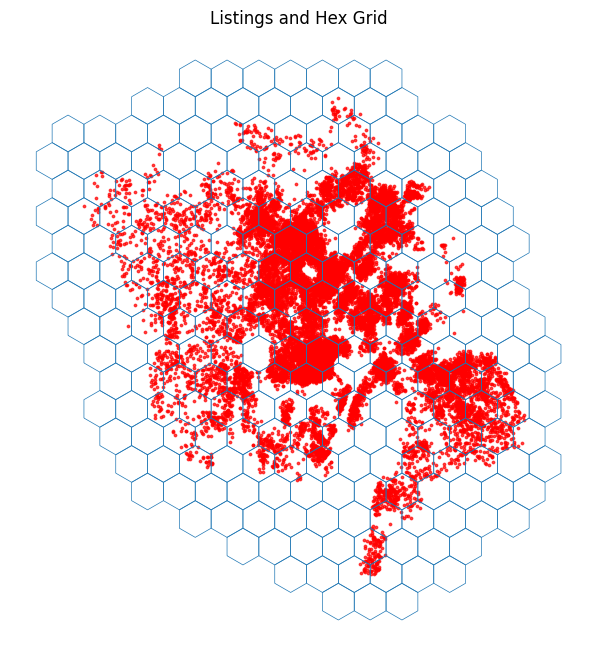

In [301]:
# --- Visualization: check that hexes look like hexes ---

fig, ax = plt.subplots(figsize=(8, 8))

# plot hex outlines
hex_grid.boundary.plot(ax=ax, linewidth=0.5)

# plot listing points
gdf.plot(ax=ax, markersize=3, color="red", alpha=0.7)

ax.set_title("Listings and Hex Grid")
ax.set_axis_off()
plt.show()

### MAP HEXES ONTO COPENHAGEN

In [302]:
# Sanity check hexbins by projecting on map of Copenhagen

import folium

# Convert hexes and points to WGS84 (lat/lon)
hex_wgs = hex_grid.to_crs(epsg=4326)
pts_wgs = gdf.to_crs(epsg=4326)

center_lat = pts_wgs.geometry.y.mean()
center_lon = pts_wgs.geometry.x.mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=11)

folium.GeoJson(
    hex_wgs,
    name="Hex grid",
    style_function=lambda feature: {
        "fillColor": "none",
        "color": "blue",
        "weight": 1,
        "fillOpacity": 0.1,
    },
).add_to(m)

sample_pts = pts_wgs.sample(min(2000, len(pts_wgs)), random_state=0)

#for _, row in sample_pts.iterrows():
for _, row in pts_wgs.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=2,
        color="red",
        fill=True,
        fill_opacity=0.7,
    ).add_to(m)

m

In [303]:
# Count unique hexes assigned to the dataset
print("Unique hex_id:",df["hex_id"].nunique())

# Check for missingness
print("Missing in hex_id:",df["hex_id"].isna().sum())

# Drop id, longitude and latitude since they are not needed anymore
df = df.drop(columns=["id", "longitude", "latitude"])

Unique hex_id: 151
Missing in hex_id: 0


## CLEAN UP "price" ATTRIBUTE



In [304]:
# Remove $, commas, and spaces, then convert to numeric
price_clean = (
    df["price"]
    .astype(str)                             # handle existing ints / NA
    .str.replace(r'[\$,]', '', regex=True)   # remove $ and commas
    .str.strip()
)

# Convert to numeric, coercing bad values (like '<NA>') to NaN
price_numeric = pd.to_numeric(price_clean, errors="coerce")

# Store back as nullable integer
df["price"] = price_numeric.astype("Int64")

## DROP NULLS FOR PRICE

Since "price" is our target variable, we will be dropping rows will null prices. We cannot train our supervised models without a target variable, and imputing the target variable would be a major misstep, as it would introduce circular reasoning (training the model to predict its own best guess).

In [305]:
display(df[["price"]].isna().sum().rename("null_count"))

,null_count
price,7912


In [306]:
# Drop null prices
df = df.dropna(subset=['price'])

In [307]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (13326, 40)


### VALIDATE PRICE ATTRIBUTE

In [308]:
df["price"].describe()

,price
count,13326.0
mean,1415.343089
std,1519.187118
min,136.0
25%,900.0
50%,1182.0
75%,1623.0
max,100000.0


In [309]:
top_10_prices = df.sort_values(by='price', ascending=False).head(10)
display(top_10_prices)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing,neighborhood_overview_missing,neighborhood_overview_length,host_location_missing,amenity_pool,amenity_wifi,amenity_parking,amenity_ac,amenity_kitchen,amenity_hot_tub,amenity_washer,amenity_self_check_in,amenity_tv,amenity_grill,hex_id
11142,unknown,100.0,75.0,0,1,1,Vesterbro-Kongens Enghave,Entire condo,Entire home/apt,2,1.0,1.0,1.0,100000,365,365,9,0,1,0,392,3654.0,0,261,1,1,1,0,0,0,1,0,0,1,0,1,0,1,0,106
18982,within an hour,99.0,100.0,0,1,1,sterbro,Entire rental unit,Entire home/apt,4,1.0,1.0,2.0,63620,1,1125,0,0,247,0,546,2617.0,0,333,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,184
19396,within an hour,99.0,100.0,0,1,1,Frederiksberg,Entire rental unit,Entire home/apt,4,1.0,2.0,2.0,63418,1,1125,3,0,247,0,563,2617.0,0,333,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,104
16465,within an hour,99.0,98.0,0,1,1,Nrrebro,Entire rental unit,Entire home/apt,4,1.0,2.0,2.0,40629,1,1125,22,1,39,0,431,1310.0,0,430,0,0,1,0,0,0,1,0,0,1,0,1,1,1,0,151
6326,within a day,50.0,75.0,0,1,1,sterbro,Entire rental unit,Entire home/apt,4,1.0,2.0,2.0,30096,3,1125,5,0,2,1,0,3345.0,0,199,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,183
1895,unknown,100.0,75.0,0,1,0,Valby,Entire home,Entire home/apt,6,2.0,1.0,2.0,20000,1,1,0,0,1,0,123,3427.0,0,102,1,1,0,55,0,0,1,1,0,1,0,1,0,1,0,100
17984,within a few hours,100.0,50.0,0,1,1,Indre By,Entire serviced apartment,Entire home/apt,6,1.0,3.0,3.0,18529,1,365,0,0,1,0,379,265.0,0,308,0,0,1,0,1,0,1,0,1,1,0,1,1,1,0,138
5716,within an hour,100.0,100.0,1,1,1,Indre By,Entire serviced apartment,Entire home/apt,8,2.0,4.0,4.0,16643,3,60,17,0,5,0,442,3782.0,0,664,0,0,0,419,0,0,1,0,1,1,1,1,1,1,1,123
20538,within a day,50.0,75.0,0,1,1,Vesterbro-Kongens Enghave,Entire rental unit,Entire home/apt,2,1.0,1.0,1.0,15429,2,4,0,0,1,1,0,4311.0,1,0,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,105
10545,within an hour,100.0,100.0,1,1,1,Indre By,Entire rental unit,Entire home/apt,6,1.0,3.0,4.0,13500,2,90,38,1,6,0,463,1342.0,1,0,0,0,0,1000,1,0,1,0,0,1,0,1,0,1,0,122


The above price statistics seem to be reasonable. For the high and low ends of the spectrum, we spot checked the listings on Airbnb.

## CORRECT DATA TYPES

In [310]:
# -----------------------
# Define column groups
# -----------------------

# Columns that should be treated as categories
cat_cols = [
    "host_response_time",
    "neighbourhood_cleansed",
    "property_type",
    "room_type",
    "hex_id"
]

# Columns that should be treated as integers (Int64)
int_cols = [
    "accommodates",
    "bedrooms",
    "beds",
    "minimum_nights",
    "maximum_nights",
    "number_of_reviews",
    "calculated_host_listings_count",
    "description_length",
    "host_about_length",
    "neighborhood_overview_length",
]

# Columns that should be treated as boolean
bool_cols = [
    "description_missing",
    "host_about_missing",
    "host_response_rate_missing",
    "host_acceptance_rate_missing",
    "neighborhood_overview_missing",
    "host_location_missing",
    "amenity_pool",
    "amenity_wifi",
    "amenity_parking",
    "amenity_ac",
    "amenity_kitchen",
    "amenity_hot_tub",
    "amenity_washer",
    "amenity_self_check_in",
    "amenity_tv",
    "amenity_grill",
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable",
]

# True floats (allowing decimals)
float_cols = [
    "host_response_rate",
    "host_acceptance_rate",
    "bathrooms",
    "host_tenure_days",
    "price",
]

# -------------------------------------------------
# Make sure beds / bedrooms are ints
# -------------------------------------------------

df["beds"] = df["beds"].round().astype("Int64")
df["bedrooms"] = df["bedrooms"].round().astype("Int64")

# -------------------------------------------------
# 4. Build dtype_map using your preferred pattern
# -------------------------------------------------

dtype_map = {}

# categories
for c in cat_cols:
    dtype_map[c] = "category"

# boolean
for c in bool_cols:
    dtype_map[c] = "boolean"

# ints (nullable)
for c in int_cols:
    dtype_map[c] = "Int64"

# floats
for c in float_cols:
    dtype_map[c] = "float64"

# -----------------------------------
# 5. Apply all conversions in one go
# -----------------------------------

df = df.astype(dtype_map)


## RE-AUDIT THE DATA AFTER CLEANSING

In [311]:
# Run the function to show the various metrics defined

audit_dataframe(df, name="Airbnb Data")


=== AIRBNB DATA AUDIT: Airbnb Data ===

Shape: 13326 rows × 40 columns

---- Missing Values ----


,null_count,null_percent,dtype




---- Data Types ----


,dtype
host_response_time,category
host_response_rate,float64
host_acceptance_rate,float64
host_is_superhost,boolean
host_has_profile_pic,boolean
host_identity_verified,boolean
neighbourhood_cleansed,category
property_type,category
room_type,category
accommodates,Int64




---- Descriptive Statistics (Numerical) ----


,count,mean,std,min,25%,50%,75%,max
host_response_rate,13326.0,88.394492,25.726883,0.0,94.0,100.0,100.0,100.0
host_acceptance_rate,13326.0,63.695032,33.095984,0.0,39.0,73.0,98.0,100.0
accommodates,13326.0,3.407849,1.715143,1.0,2.0,3.0,4.0,16.0
bathrooms,13326.0,1.101981,0.338566,0.0,1.0,1.0,1.0,8.0
bedrooms,13326.0,1.621117,0.913029,0.0,1.0,1.0,2.0,9.0
beds,13326.0,1.868303,1.276071,0.0,1.0,1.0,2.0,16.0
price,13326.0,1415.343089,1519.187118,136.0,900.0,1182.0,1623.0,100000.0
minimum_nights,13326.0,4.089074,11.909834,1.0,2.0,3.0,4.0,730.0
maximum_nights,13326.0,288.836035,351.57652,1.0,20.0,100.0,365.0,1125.0
number_of_reviews,13326.0,21.741483,56.212807,0.0,2.0,7.0,20.0,2366.0




---- Descriptive Statistics (Categorical) ----


,count,unique,top,freq
host_response_time,13326,5,within an hour,4380
neighbourhood_cleansed,13326,11,Nrrebro,2249
property_type,13326,50,Entire rental unit,7829
room_type,13326,4,Entire home/apt,12205
hex_id,13326,150,105,682




---- Unique Value Counts ----


,unique_counts
host_is_superhost,2
host_has_profile_pic,2
host_identity_verified,2
host_location_missing,2
amenity_wifi,2
host_about_missing,2
amenity_pool,2
amenity_parking,2
host_response_rate_missing,2
host_acceptance_rate_missing,2




---- Boolean Column Distributions ----


,column,dtype,true_count,false_count,na_count,true_percent,false_percent,na_percent
0,host_is_superhost,boolean,1948,11378,0,14.62,85.38,0.0
1,host_has_profile_pic,boolean,12775,551,0,95.87,4.13,0.0
2,host_identity_verified,boolean,11939,1387,0,89.59,10.41,0.0
3,instant_bookable,boolean,1288,12038,0,9.67,90.33,0.0
4,description_missing,boolean,374,12952,0,2.81,97.19,0.0
5,host_about_missing,boolean,7769,5557,0,58.30,41.70,0.0
6,host_response_rate_missing,boolean,1502,11824,0,11.27,88.73,0.0
7,host_acceptance_rate_missing,boolean,748,12578,0,5.61,94.39,0.0
8,neighborhood_overview_missing,boolean,9102,4224,0,68.30,31.70,0.0
9,host_location_missing,boolean,2469,10857,0,18.53,81.47,0.0




---- Categorical Cardinality ----


,column,unique_values
0,host_response_time,5
1,neighbourhood_cleansed,11
2,property_type,50
3,room_type,4
4,hex_id,150




---- Duplicate Rows ----


,duplicate_rows
0,1




---- Sample Values ----


,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing,neighborhood_overview_missing,neighborhood_overview_length,host_location_missing,amenity_pool,amenity_wifi,amenity_parking,amenity_ac,amenity_kitchen,amenity_hot_tub,amenity_washer,amenity_self_check_in,amenity_tv,amenity_grill,hex_id
19431,within a day,100.0,86.0,False,True,False,Bispebjerg,Private room in condo,Private room,2,1.0,0,1,622.0,1,30,6,False,1,False,344,4371.0,False,219,False,False,True,0,False,False,True,False,False,True,False,False,False,False,False,164
19925,within an hour,100.0,100.0,False,True,True,Amager Vest,Entire rental unit,Entire home/apt,2,1.0,1,2,1621.0,5,365,1,True,1,False,483,3205.0,True,0,False,False,True,0,False,False,False,True,False,True,False,True,True,False,False,92
4882,within an hour,90.0,92.0,False,True,True,Frederiksberg,Entire condo,Entire home/apt,4,1.0,2,1,1710.0,3,30,21,False,1,False,479,2250.0,False,329,False,False,False,307,False,False,True,False,False,True,False,True,True,True,False,120
12347,within an hour,79.0,98.0,False,True,True,Indre By,Private room in hostel,Private room,2,0.0,1,1,860.0,1,14,122,True,3,False,219,761.0,True,0,False,False,True,0,True,False,True,False,False,False,False,False,False,False,False,139
21045,unknown,100.0,60.0,False,True,True,Nrrebro,Entire rental unit,Entire home/apt,3,1.0,1,2,720.0,3,365,0,True,1,False,147,4689.0,False,67,True,False,True,0,False,False,True,False,False,True,False,False,False,False,False,165




=== END AUDIT ===



We will drop the single duplicated row. Everything else looks good.

In [312]:
df.drop_duplicates(inplace=True)
print("Data set shape:",df.shape)

Data set shape: (13325, 40)


# IMPORT LIBRARIES FOR MODELING

In [313]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import (mean_absolute_error, mean_squared_error, r2_score,
                             accuracy_score, precision_score, recall_score,
                             f1_score, confusion_matrix, classification_report,
                             roc_auc_score, roc_curve, max_error, mean_absolute_percentage_error)

# TRAIN/TEST SPLIT AND PREPROCESSING

In [ ]:
# ======================================
# DEFINE TARGET (y) AND FEATURES (X)
# ======================================

target_col = "price"

# X = all columns except the target
X = df.drop(columns=[target_col])

# y = the target column
y = df[target_col]


# ===============================================
# TRAIN / TEST SPLIT (BEFORE ANY PREPROCESSING)
# ===============================================

# We split the data into:
# - Training set (used to fit/learn the model - we will perform cross validation within the training set)
# - Test set (a hold-out to evaluate final performance)

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)


# ============================================
# IDENTIFY NUMERIC, BOOLEAN, AND CATEGORICAL FEATURES
# ============================================

boolean_features = X_train.select_dtypes(include="boolean").columns.tolist()
numeric_features = (
    X_train
    .select_dtypes(include=["float64", "Int64"])
    .columns
    .difference(boolean_features)
    .tolist()
)
categorical_features = X_train.select_dtypes(include=["category"]).columns.tolist()

print("Boolean features:", boolean_features)
print("Numeric features:", numeric_features)
print("Categorical features:", categorical_features)

# ===================================================
# SET UP PREPROCESSING STEPS
# ===================================================

# - Numeric features: StandardScaler
# - Boolean features: "passthrough" (keep 0/1 as-is)
# - Categorical features: OneHotEncoder
#
# This "preprocessor" will later be plugged into a Pipeline
# together with a model (e.g., Ridge, RandomForest, KNN).

preprocessor = ColumnTransformer(
    transformers=[
        # ("name_for_step", transformer_object, list_of_columns)
        ("num", StandardScaler(), numeric_features),
        ("bool", "passthrough", boolean_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ]
)

print("\nPreprocessing setup complete.\n")
print(f"  Numeric features: {len(numeric_features)}")
print(f"  Boolean features: {len(boolean_features)}")
print(f"  Categorical features: {len(categorical_features)}")

Boolean features: ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable', 'description_missing', 'host_about_missing', 'host_response_rate_missing', 'host_acceptance_rate_missing', 'neighborhood_overview_missing', 'host_location_missing', 'amenity_pool', 'amenity_wifi', 'amenity_parking', 'amenity_ac', 'amenity_kitchen', 'amenity_hot_tub', 'amenity_washer', 'amenity_self_check_in', 'amenity_tv', 'amenity_grill']
Numeric features: ['accommodates', 'availability_30', 'bathrooms', 'bedrooms', 'beds', 'calculated_host_listings_count', 'description_length', 'host_about_length', 'host_acceptance_rate', 'host_response_rate', 'host_tenure_days', 'maximum_nights', 'minimum_nights', 'neighborhood_overview_length', 'number_of_reviews']
Categorical features: ['host_response_time', 'neighbourhood_cleansed', 'property_type', 'room_type', 'hex_id']

Preprocessing setup complete.

  Numeric features: 15
  Boolean features: 20
  Categorical features: 5


# ESTABLISH BASELINES (CREATE FUNCTION TO RUN MODELS)

In [ ]:
from sklearn.dummy import DummyRegressor

# The following function wraps the given model in a pipeline with the
# preprocessor and evaluates it with cross-validation on the training
# data. No test-set evaluation happens here to prevents leakage.

def evaluate_model(model, model_name):

    pipe = Pipeline(steps=[
        ("preprocess", preprocessor),
        ("model", model),
    ])

   # --- CV MAE ---
    cv_mae_scores = -cross_val_score(
        pipe,
        X_train,
        y_train,
        cv=5,
        scoring="neg_mean_absolute_error"
    )
    cv_mae_mean = cv_mae_scores.mean()

    # --- CV RMSE ---
    cv_rmse_scores = np.sqrt(
        -cross_val_score(
            pipe,
            X_train,
            y_train,
            cv=5,
            scoring="neg_mean_squared_error"
        )
    )
    cv_rmse_mean = cv_rmse_scores.mean()

    # --- CV R² ---
    cv_r2_scores = cross_val_score(
        pipe,
        X_train,
        y_train,
        cv=5,
        scoring="r2"
    )
    cv_r2_mean = cv_r2_scores.mean()

    print(f"\n=== {model_name} (CV Only) ===")
    print(f"CV MAE:  {cv_mae_mean:.3f}")
    print(f"CV RMSE: {cv_rmse_mean:.3f}")
    print(f"CV R²:   {cv_r2_mean:.3f}")

    return {
        "model": model_name,
        "cv_mae": cv_mae_mean,
        "cv_rmse": cv_rmse_mean,
        "cv_r2": cv_r2_mean,
    }

In [ ]:
# 1) Baseline: predict the mean availability
baseline_results = evaluate_model(
    DummyRegressor(strategy="mean"),
    "DummyRegressor (mean)"
)


=== DummyRegressor (mean) (CV Only) ===
CV MAE:  563.524
CV RMSE: 948.750
CV R²:   -0.001


These results tell us that if we always predict the mean price for a new listing, the average error (MAE) will be DKK564 (in either direction). The RSME is higher (DKK949) because the model makes some larger errors, which are punished more aggresively. The R² of 0 makes sense, since the model explains none of the variance in the data.

In [ ]:
# 2) Simple Linear Regression
linreg_results = evaluate_model(
    LinearRegression(),
    "LinearRegression"
)


=== LinearRegression (CV Only) ===
CV MAE:  360.878
CV RMSE: 687.586
CV R²:   0.497


This simple regression model improved the MAE (that is, how many DKK on average the model is off by) to DKK360.878. The RMSE is also better at DKK687.586. The R² value is 0.497, meaning that this model captures 50% of the variance in the data.

In [ ]:
# 3) Decision Tree (nonlinear, baseline settings)
dt_results = evaluate_model(
    DecisionTreeRegressor(random_state=42),
    "DecisionTreeRegressor"
)


=== DecisionTreeRegressor (CV Only) ===
CV MAE:  466.251
CV RMSE: 875.284
CV R²:   0.150


The decision tree is worse by all metrics than simple linear regression. The R² value is 0.15 (15% of the variance is captured), MAE is 466 (the average prediction is off by DKK466 in either direction), and the RMSE is 875.

**THIS MODEL IS NOT WORTH PURSUING AND WILL THUS BE EXCLUDED FROM GRIDSEARCHCV**

In [ ]:
# 4) Random Forest (nonlinear ensemble)
rf_results = evaluate_model(
    RandomForestRegressor(
        n_estimators=30,
        random_state=42
    ),
    "RandomForestRegressor"
)


=== RandomForestRegressor (CV Only) ===
CV MAE:  340.046
CV RMSE: 674.247
CV R²:   0.518


This is the best model so far.

MAE:  340.046;
RMSE: 674.247;
R²:   0.518

In [ ]:
# 5) Gradient Boosting (strong nonlinear model)
gbr_results = evaluate_model(
    GradientBoostingRegressor(
        random_state=42,
        learning_rate=0.1,
        n_estimators=30
    ),
    "GradientBoostingRegressor"
)


=== GradientBoostingRegressor (CV Only) ===
CV MAE:  352.512
CV RMSE: 689.806
CV R²:   0.494


This is also a good model, but slightly worse than random forest.

MAE:  352.512;
RMSE: 689.806;
R²:   0.494

In [ ]:
# 6) KNN (instance-based model)
knn_results = evaluate_model(
    KNeighborsRegressor(n_neighbors=5),
    "KNeighborsRegressor (k=5)"
)


=== KNeighborsRegressor (k=5) (CV Only) ===
CV MAE:  381.362
CV RMSE: 740.891
CV R²:   0.410


KNN isn't bad, but isn't great either.

MAE:  381.362;
RMSE: 740.891;
R²:   0.410

# DEFINE THE MODELS AND ASSOCIATED HYPERPARAMETERS SO WE CAN FIND THE BEST COMBINATION USING GRIDSEARCHCV

In [ ]:
# ==========================================
# DEFINE MODELS AND THEIR PARAMETER GRIDS BASED ON PRELIMINARY RESULTS ABOVE
# ==========================================

# We create a dictionary where:
# - The key (e.g., "ridge") is just a name we choose for the model
# - The value holds:
#     - "estimator": the actual sklearn model object
#     - "param_grid": a dictionary of hyperparameters to explore for that model
#
# IMPORTANT:
# When we plug a model into a Pipeline with the step name "model",
# we must prefix hyperparameter names with "model__" so GridSearchCV
# knows which step in the pipeline they belong to.

models_config = {
    "linear_regression": {
        "estimator": LinearRegression(),
        "param_grid": {} # No hyperparameters for linear regression
    },
    "ridge": {
        "estimator": Ridge(random_state=42),   # Ridge regression (L2 regularization)
        "param_grid": {
            # alpha controls the strength of regularization:
            # - small alpha: weak regularization (closer to plain linear regression)
            # - large alpha: stronger shrinkage of coefficients
            "model__alpha": [0.1, 1.0, 10.0]
        }
    },
    "lasso": {
        "estimator": Lasso(random_state=42),   # Lasso regression (L1 regularization)
        "param_grid": {
            # L1 can drive some coefficients exactly to zero (feature selection)
            "model__alpha": [0.01, 0.1, 1.0]
        }
    },
    "random_forest": {
        "estimator": RandomForestRegressor(random_state=42),
        "param_grid": {
            # n_estimators: number of trees in the forest
            "model__n_estimators": [100, 200],     # Reasonable, not too big for project
            # max_depth: how deep each individual tree can grow (controls overfitting)
            "model__max_depth": [5, 10, 20],
            # min_samples_leaf: minimum samples in a leaf node (controls overfitting)
            "model__min_samples_leaf": [5, 10, 20]
        }
    },
    "GradientBoosting": {
        "estimator": GradientBoostingRegressor(random_state=42),
        "param_grid": {
            "model__n_estimators": [100, 200, 300],
            "model__learning_rate": [0.01, 0.1],
        }
  },
    "knn": {
        "estimator": KNeighborsRegressor(),
        "param_grid": {
            "model__n_neighbors": [3, 7, 11, 15, 20],
            "model__weights": ["uniform", "distance"],
            "model__metric": ["euclidean", "manhattan"],
        }
  }
}

# LOOP OVER EACH MODEL IN THE CONFIG DICTIONARY ABOVE AND RUN GRIDSEARCHCV TO ESTABLISH THE BEST COMBINATION OF HYPERPARAMETERS

In [ ]:
# ============================================
# LOOP OVER MODELS: BUILD PIPELINE + TUNE IT
# ============================================

results = []          # store a summary of results for each model in this list
best_estimators = {}  # store the refit best pipeline per model

# We use the same primary evaluation metric for all models:
# - MAE (Mean Absolute Error) as scoring metric in CV
#   (in sklearn, higher scores are better, so we use "neg_mean_absolute_error")
scoring_metric = "neg_mean_absolute_error"

for name, cfg in models_config.items():
    print(f"\n======================")
    print(f"Running GridSearch for: {name}")
    print(f"======================")

    pipe = Pipeline(steps=[
        ("preprocess", preprocessor),
        ("model", cfg["estimator"])
    ])

    # GridSearchCV will:
    # - try all combinations of hyperparameters in cfg["param_grid"]
    # - for each combination, perform cross-validation (cv=5 splits)
    # - use the scoring metric (negative MAE) to rank combinations
    # - keep track of the best combination found

    grid_search = GridSearchCV(
        estimator=pipe,
        param_grid=cfg["param_grid"],
        cv=5,                                            # uses 5-fold cross-validation
        scoring=scoring_metric,                          # "neg_mean_absolute_error"
        verbose=1                                        # print progress
    )

    grid_search.fit(X_train, y_train)                    # runs gridsearch to test all combinations of hyperparameters

    print("Best hyperparameters found (CV):")
    print(grid_search.best_params_)

    # best_score_ is NEGATIVE MAE (because sklearn maximizes scores),
    # so we multiply by -1 to get the actual MAE.
    best_cv_mae = -grid_search.best_score_
    print(f"Best CV MAE: {best_cv_mae:.3f}")

    results.append({                                    # the results array we defined before the loop to store the best parameters for each estimator
        "name": name,
        "best_cv_mae": best_cv_mae,
        "best_params": grid_search.best_params_,
    })

    best_estimators[name] = grid_search.best_estimator_  # refit on full training set


Running GridSearch for: linear_regression
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best hyperparameters found (CV):
{}
Best CV MAE: 360.878

Running GridSearch for: ridge
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best hyperparameters found (CV):
{'model__alpha': 10.0}
Best CV MAE: 353.258

Running GridSearch for: lasso
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 201465041.59211326, tolerance: 338731.3938566749
  model = cd_fast.sparse_enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129035882.14254665, tolerance: 506908.70595305064
  model = cd_fast.sparse_enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40745359.53114891, tolerance: 479753.85899058153
  model = cd_fast.sparse_enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: Conv

Best hyperparameters found (CV):
{'model__alpha': 1.0}
Best CV MAE: 353.930

Running GridSearch for: random_forest
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best hyperparameters found (CV):
{'model__max_depth': 20, 'model__min_samples_leaf': 5, 'model__n_estimators': 200}
Best CV MAE: 334.851

Running GridSearch for: GradientBoosting
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best hyperparameters found (CV):
{'model__learning_rate': 0.1, 'model__n_estimators': 300}
Best CV MAE: 322.273

Running GridSearch for: knn
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best hyperparameters found (CV):
{'model__metric': 'manhattan', 'model__n_neighbors': 15, 'model__weights': 'distance'}
Best CV MAE: 352.091


ANALYZE RESULTS WHEN DONE

# TRY PCA FOR THE LINEAR MODELS (DOES NOT HELP FOR TREE-BASED MODELS)

# RANK THE MODELS BASED ON CV RESULTS AND CHOOSE THE BEST MODEL FOR FINAL TEST SET ANALYSIS

In [ ]:
# =======================================
# CREATE SUMMARY TABLE OF MODEL RESULTS
# =======================================

# Convert the list of result dicts into a DataFrame.
# Each row corresponds to one model (linear regression, ridge, lasso, RF, GB)
results_df = pd.DataFrame(results)

# Sort models by their CV MAE (lower is better performance).
# We reset the index so the top model becomes row 0.
results_df = (
    results_df
    .sort_values(by="best_cv_mae", ascending=True)
    .reset_index(drop=True)
)

print("\n===== MODEL COMPARISON (by CV MAE — lower is better) =====")
display(results_df)


===== MODEL COMPARISON (by CV MAE — lower is better) =====


,name,best_cv_mae,best_params
0,GradientBoosting,322.272913,"{'model__learning_rate': 0.1, 'model__n_estima..."
1,random_forest,334.851359,"{'model__max_depth': 20, 'model__min_samples_l..."
2,knn,352.091488,"{'model__metric': 'manhattan', 'model__n_neigh..."
3,ridge,353.257784,{'model__alpha': 10.0}
4,lasso,353.929802,{'model__alpha': 1.0}
5,linear_regression,360.878021,{}


In [ ]:
# =======================================
# SELECT THE BEST MODEL BASED ON CV MAE
# =======================================

# EVEN THOUGH GRADIENTBOOSTING PERFORMS THE BEST, IT HAS A TENDENCY TO OVERFIT. THEREFORE, WE ARE CHOOSING RANDOM FOREST.
selected_model_name = "random_forest"

# Retrieve the already-refit best estimator from storage.
# IMPORTANT: GridSearchCV has already refit this best estimator
# on the FULL training data using the best hyperparameters.
final_model = best_estimators[selected_model_name]

print(f"\nBest model chosen based on CV MAE: {selected_model_name}")
print("This model is already refit on the full training set (via GridSearchCV).")

# =======================================
# EVALUATE THE BEST MODEL ON THE TEST SET
# =======================================

# Use the final model to generate predictions for the held-out test set.
y_pred_test = final_model.predict(X_test)

# Compute evaluation metrics on the test set.
test_mae = mean_absolute_error(y_test, y_pred_test)     # average magnitude of error
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))  # penalizes large errors
test_r2 = r2_score(y_test, y_pred_test)                 # % variance explained

# Create a DataFrame for clean formatted display of test metrics.
test_results_df = pd.DataFrame({
    "Test MAE":  [test_mae],
    "Test RMSE": [test_rmse],
    "Test R²":   [test_r2],
}, index=[selected_model_name])

print("\n===== FINAL TEST PERFORMANCE (held-out) =====")
display(test_results_df)


Best model chosen based on CV MAE: random_forest
This model is already refit on the full training set (via GridSearchCV).

===== FINAL TEST PERFORMANCE (held-out) =====


,Test MAE,Test RMSE,Test R²
random_forest,359.284042,1642.484567,0.131848
